# Stavia Spatially aware cartography on MERFISH

This tutorial focuses on how to perform TI analysis on MERFISH (Moffitt 2018), a spatial gene expression profile of preoptic mouse hypothalamus. We are able to integrate the single-cell spatial contexts and their gene expressions to present a cartographic view of the system and the relationships between cell populations.

## Import Libraries

In [1]:
import scanpy as sc
import pandas as pd
import squidpy as sq
import matplotlib.pyplot as plt
import pyVIA.core as via
import numpy as np
sc.logging.print_header()
from datetime import datetime
from collections import defaultdict
import matplotlib.cm as cm
from pyVIA import datasets_via as datasets
import warnings
warnings.filterwarnings("ignore")

C:\Users\Kevin tsia\anaconda3\envs\via2\Lib\site-packages\phate\__init__.py
scanpy==1.9.8 anndata==0.10.5.post1 umap==0.5.5 numpy==1.26.4 scipy==1.12.0 pandas==2.2.1 scikit-learn==1.4.1.post1 statsmodels==0.14.1 igraph==0.11.4 pynndescent==0.5.11


## Load Dataset

Load the dataset and select a z plane to get a 2D tissue section to work on.

In [2]:
# load the pre-processed dataset
# adata = sq.datasets.merfish() #AnnData object with n_obs × n_vars = 73655 × 161

# Download data (can also copy this file from Via Github Datasets folder)
adata = datasets.moffitt_preoptic()
print(adata)
'''
AnnData object with n_obs × n_vars = 73655 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch'
    uns: 'Cell_class_colors'
    obsm: 'spatial', 'spatial3d'
    animal id {1}
animal sex {'Female'}
animal behaviour {'Naive'}
Bregma {1.0, -28.999999999999996, 6.0, -24.0, 11.0, -19.0, 16.0, -14.000000000000002, 21.0, -9.0, 26.0, -4.0}
161
'''
# selecting a slice at Bregma -29 and subsetting the anndata
bregma =-28.999999999999996 

adata = adata[adata.obs.Bregma == bregma]  # View of AnnData object with n_obs × n_vars = 6185 × 161 #26

AnnData object with n_obs × n_vars = 73655 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch'
    uns: 'Cell_class_colors'
    obsm: 'spatial', 'spatial3d'


## Cell annotations
Organise cell annotations for validation purpose in later sections.

In [3]:
# do some preliminary house-keeping of labels (this is optional and we do it here because we want to have better automatic color separation between cell types that have similar starting letters)
true_label = [i if i != 'Excitatory' else 'xExcitatory' for i in adata.obs['Cell_class']] #relabeling Excitatory to more easily distinguish colors between Endothelial and Excitatory
cell_class_labels = [i for i in adata.obs['Cell_class']]
# simplifying class labels for easier color coding/visualization
for ei, i in enumerate(cell_class_labels):
    if i in ['OD Immature 2', 'OD Immature 1']: true_label[ei] = 'OD_Immature'
    if i in ['OD Mature 1', 'OD Mature 2','OD Mature 3','OD Mature 4']: true_label[ei] = 'OD_Mature'
    if i in ['Endothelial 1','Endothelial 2','Endothelial 3']: true_label[ei] = 'Endothelial'

adata.obs['true_label'] = [i for i in true_label]
set_true_label = list(set(true_label))

## Tissue section scatter plot colored based on cell types 

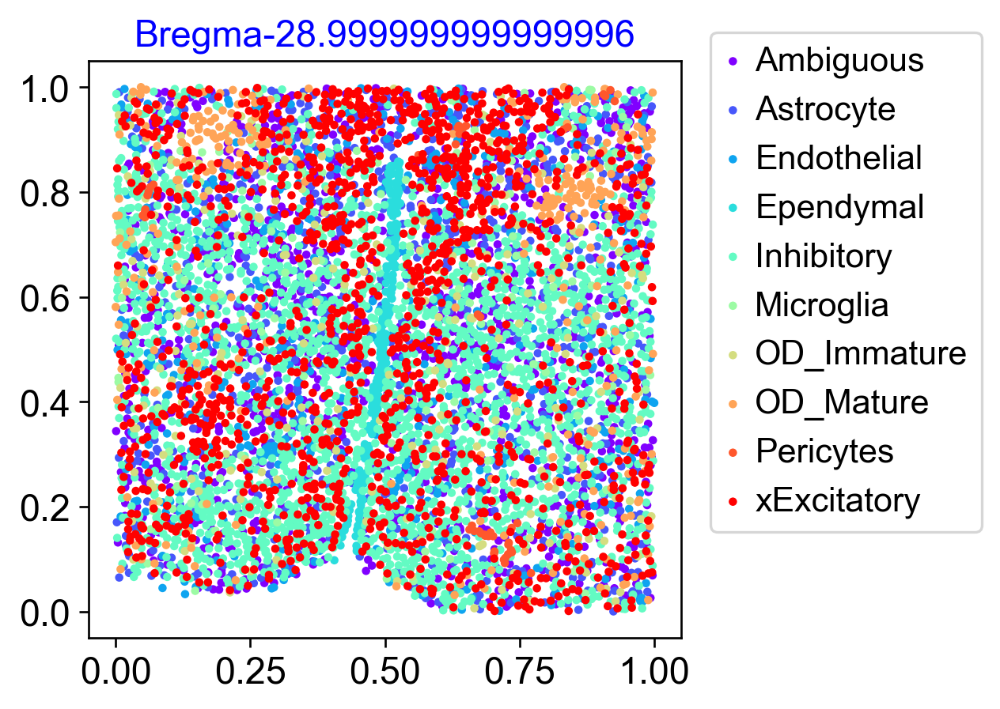

In [4]:
#optionally create a celltype_to_color dictionary so that cell types are consistenly plotted with the same colors in all plots
color_dict = {}
set_labels = list(set(true_label))
set_labels.sort(reverse=False)#True)
palette = cm.get_cmap('rainbow', len(set_labels))
cmap_ = palette(range(len(set_labels)))
for index, value in enumerate(set_labels):
    color_dict[value] = cmap_[index]
# have a look at the major cell types on the tissue slice
coords = adata.obsm['spatial']
f, ax = via.plot_scatter(adata.obsm['spatial'], labels=true_label, color_dict=color_dict, show_legend=True, cmap='rainbow', alpha=1, s=10, title='Bregma'+str(bregma), text_labels=False, hide_axes_ticks=False)
ax.legend(bbox_to_anchor=(1.05, 1.05), borderaxespad=0)
plt.show()

## Cell Population

{'OD_Mature': 323,
 'OD_Immature': 221,
 'Astrocyte': 763,
 'Endothelial': 495,
 'Ambiguous': 992,
 'xExcitatory': 1319,
 'Inhibitory': 2013,
 'Pericytes': 46,
 'Ependymal': 202,
 'Microglia': 135}

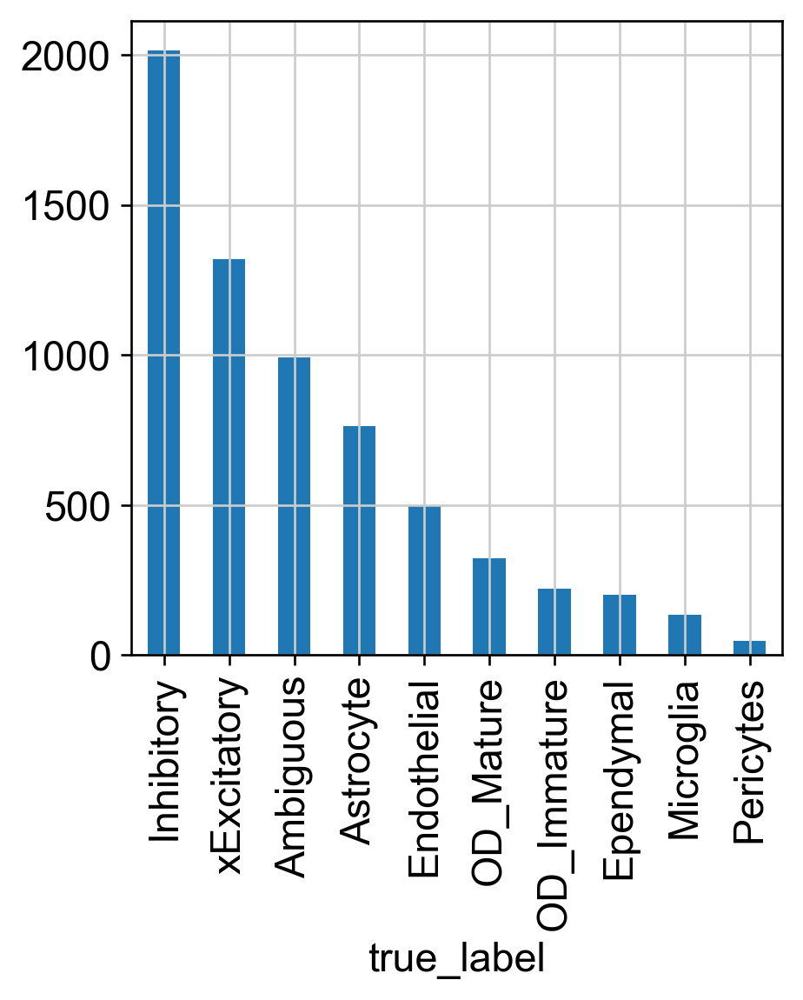

In [5]:
# Cell population in each major celltype
d = {val: true_label.count(val) for val in set(adata.obs['true_label'])}
display(d)
ax = adata.obs['true_label'].value_counts().plot.bar()

## Run StaVia
There are 2 main steps in how we can incorporate spatial information. 
Step 1: Modifying the gene-expression such that we smooth a cell's gene expression with that of its spatial neighbors. 
Step 2: uses spatial information in the Trajectory inference computation. 
 
Keep `do_spatial = True` if you would like to incorporate spatial data to the VIA analysis. 
Step 1 Parameters:
We can adjust the weight of influence of the spatial data for by tuning the parameters:
spatial_knn: number of knn based on spatial-cell-location. 
spatial_weight: the weight given to gene-expression of spatial neighbors when recomputing gene-expression to include expression of neighbors on tissue slice
```
spatial_knn_input = 6
spatial_weight = 0.3
```
Step 2 Parameters:
```
do_spatial_knn=True. #True means that spatial information is used to adjust the predicted trajectory
do_spatial_layout= True/False. #True means that the spatial information is used to modify the graph-layout, but should only be used when all cells come from the same tissue. 
spatial_coords = coords. #ndarray (ncells x 2) of cell location on tissue slice(s) 
spatial_knn_trajectory =6. #is the number of spatial neighbors used in the gene-spatial knn graph. this is different from 'knn' parameter which selects neighbors based on gene/feature input distances
```

If you have previously run VIA or other clustering algorithms, we can provide the clustering prelabels to initialise the VIA run.

In the above senario, we can set `do_rank_genes = True` to get clustering based DEGs among different cell types. This step can be carried out after the VIA run with the computed clustering labels.

In [6]:
# setting parameters for StaVia
cluster_graph_pruning = 0.5 # (0-1) higher value means more edges in the StaVia TI-clustergraph are retained
edgepruning_clustering_resolution = 0.3 #(0-1) # higher values means bigger and fewer clusters
random_seed = 2
knn =10 # 10, 20, 30 are good as well
neighboring_terminal_states_threshold = 4
root = ["Ependymal"]

do_spatial =True
n_pcs =50

import random
pseudorand = random.randint(0, 1000)
#SPATIAL STEP 1 (modify gene expression of input data based on expression of spatial neighbors). This is computed before run_via() and is optional
if do_spatial:
    coords=adata.obsm['spatial']

    spatial_knn_input = 6 # higher values of spatial_knn results in more gene-smoothing across neighboring cells on the slice
    spatial_weight = 0.3
    X_spatial_exp = via.spatial_input(X_genes = adata.X, spatial_coords=coords, knn_spatial=spatial_knn_input, spatial_weight=spatial_weight)

    adata.obsm['X_spatial_adjusted'] = X_spatial_exp
    adata.obsm["spatial_pca"] = sc.tl.pca(adata.obsm['X_spatial_adjusted'],n_comps=n_pcs)

    input = adata.obsm['spatial_pca'][:,0:n_pcs]
    print(f'end X_spatial input')
else:
    spatial_knn_input = 0
    spatial_knn_trajectory = 0
    coords = None
    spatial_weight = 0
    sc.tl.pca(adata, n_comps=n_pcs)
    input = adata.obsm['X_pca'][:,0:n_pcs]


WORK_PATH = './'
use_prelabels = False #True
if use_prelabels:
    #if you have saved a set of cluster labels (from a previous run of StaVia or another clustering method) then you can use them 
    pre_labels =  pd.read_csv(WORK_PATH + '/Viagraphs/bregma_m28p9/spatialknn6/PARC_Bregma-28_pseudrand320.csv')
    pre_labels = pre_labels['parc'].tolist()
    print('using prelabels',set(pre_labels))

    adata.obs['parc'] = ['c' + str(i) for i in pre_labels]
    adata.obs['parc_num'] = [i for i in pre_labels]
    
else: pre_labels = None

# SPATIAL STEP 2 (Via graph spatial parameters)
# set: do_spatial_knn=do_spatial, do_spatial_layout= do_spatial, spatial_coords = coords, spatial_knn=spatial_knn_trajectory (can be the same value as spatial_knn_input or can be tuned)
# spatial_coords, ndarray (ncells x 2) of cell location on tissue slice(s) 
# do_spatial_layout = True means that the spatial information is used to modify the graph-layout, but should only be used when all cells come from the same tissue.
# spatial_knn (int) is the number of spatial neighbors used in the gene-spatial knn graph. this is different from 'knn' parameter which selects neighbors based on gene/feature input distances
spatial_knn_trajectory = 6 # e.g. set it to the same value as spatial_knn_input, but the user can change this
v0 = via.VIA(data=input, true_label=true_label, edgepruning_clustering_resolution=edgepruning_clustering_resolution, labels=pre_labels,
                 edgepruning_clustering_resolution_local=1, knn=knn,
                 cluster_graph_pruning=cluster_graph_pruning,
                 neighboring_terminal_states_threshold=neighboring_terminal_states_threshold,
                 too_big_factor=0.3, resolution_parameter=1,
                 root_user=root, dataset='group', random_seed=random_seed,
                 is_coarse=True, preserve_disconnected=True, pseudotime_threshold_TS=40, x_lazy=0.99,
                 alpha_teleport=0.99, edgebundle_pruning=cluster_graph_pruning, edgebundle_pruning_twice=True, do_spatial_knn=do_spatial, do_spatial_layout= do_spatial, spatial_coords = coords, spatial_knn=spatial_knn_trajectory)
v0.run_VIA()

2024-03-01 17:14:57.121364	These slices are present: ['slice1']
x_coords shape (6509, 2)
x_genes shape (6509, 161)
nsamples (slices) 6509
2024-03-01 17:14:58.152594	Shape spatial neighbors and data shape (6509, 6) (6509, 6)
2024-03-01 17:14:58.199468	Spatial gene smoothing... (6509, 6)
end X_spatial input
2024-03-01 17:14:58.426018	Running VIA over input data of 6509 (samples) x 50 (features)
2024-03-01 17:14:58.426018	Knngraph has 10 neighbors
2024-03-01 17:15:00.582737	Since no slice-labels were provided, all cells are assumed to be from the same tissue slice 
2024-03-01 17:15:00.582737	Using spatial information to guide knn graph construction. Note! If cells are from different slices of tissue, provide a list of tissue-slice IDs 
2024-03-01 17:15:00.598338	These slices are present: ['slice1']
2024-03-01 17:15:01.614877	Shape neighbors (6509, 10) and spatial neighbors (6509, 6)
2024-03-01 17:15:01.614877	Shape of spatially augmented neighbors (6509, 16)
2024-03-01 17:15:01.790113	Fin

  0%|                                                                                         | 0/1300 [00:00<…

memory for rw2 hittings times  2. Using rw2 based pt
2024-03-01 17:15:19.629476	Identifying terminal clusters corresponding to unique lineages...
2024-03-01 17:15:19.629476	Closeness:[0, 3, 5, 6, 7, 11, 15, 16, 17, 20, 21, 24, 27, 29, 30, 34, 43]
2024-03-01 17:15:19.629476	Betweenness:[0, 1, 2, 3, 4, 6, 7, 9, 11, 12, 13, 16, 17, 20, 21, 24, 26, 27, 29, 30, 33, 34, 36, 37, 39, 40, 42, 43]
2024-03-01 17:15:19.629476	Out Degree:[0, 3, 5, 6, 7, 9, 11, 15, 16, 20, 21, 24, 26, 27, 28, 29, 30, 33, 34, 35, 36, 37, 38, 40, 41, 43]
2024-03-01 17:15:19.629476	Cluster 0 had 4 or more neighboring terminal states [3, 5, 6, 7, 11, 15, 16, 20, 21, 24, 26, 27, 29, 30, 34, 36, 37, 43] and so we removed cluster 37
2024-03-01 17:15:19.629476	Cluster 3 had 4 or more neighboring terminal states [0, 7, 11, 21, 24, 26, 27] and so we removed cluster 3
2024-03-01 17:15:19.629476	Cluster 5 had 4 or more neighboring terminal states [0, 6, 7, 11, 15, 16, 20, 24, 26, 29, 40] and so we removed cluster 20
2024-03-01 

  0%|                                                                                         | 0/1000 [00:00<…

2024-03-01 17:15:24.265260	Cluster or terminal cell fate 0 is reached 1000.0 times
2024-03-01 17:15:24.327753	Cluster or terminal cell fate 5 is reached 601.0 times
2024-03-01 17:15:24.374627	Cluster or terminal cell fate 7 is reached 1000.0 times
2024-03-01 17:15:24.421496	Cluster or terminal cell fate 15 is reached 999.0 times
2024-03-01 17:15:24.492464	Cluster or terminal cell fate 16 is reached 467.0 times
2024-03-01 17:15:24.535213	Cluster or terminal cell fate 24 is reached 790.0 times
2024-03-01 17:15:24.597706	Cluster or terminal cell fate 29 is reached 904.0 times
2024-03-01 17:15:24.644578	Cluster or terminal cell fate 30 is reached 998.0 times
2024-03-01 17:15:24.726092	Cluster or terminal cell fate 40 is reached 99.0 times
2024-03-01 17:15:24.753152	Cluster or terminal cell fate 43 is reached 1000.0 times
2024-03-01 17:15:24.784401	There are (10) terminal clusters corresponding to unique lineages {0: 'Endothelial', 5: 'Inhibitory', 7: 'OD_Mature', 15: 'Ambiguous', 16: 'Inhi

Right plot is VIA graph with cell type label and visualised cell type population in each clusters. <br>
Left plot is colored by pseudo time with a 'rainbow' colormap. 

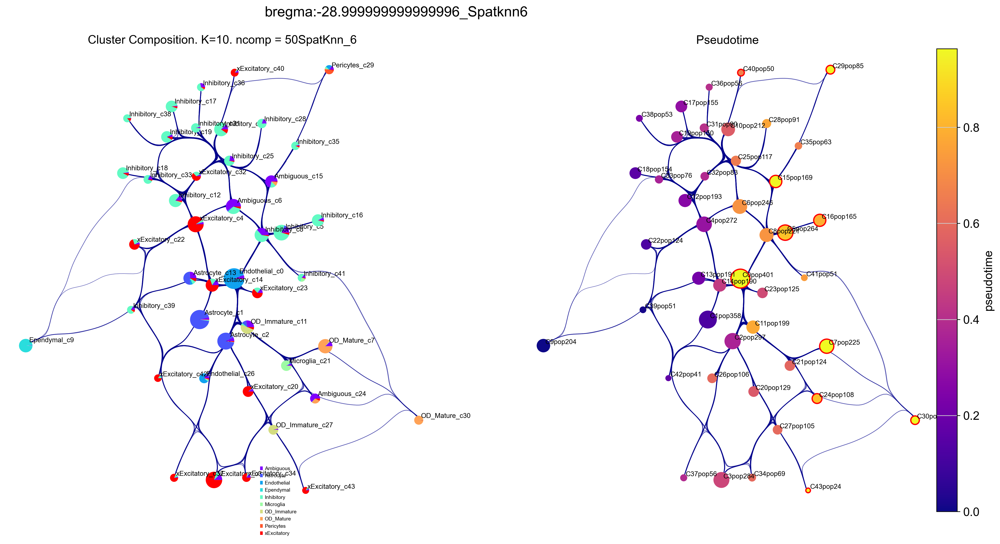

In [7]:
f2, ax1, ax2 = via.plot_piechart_viagraph(via_object=v0, cmap_piechart='rainbow', cmap='plasma', pie_size_scale=0.4, linewidth_edge=0.6,
                                          reference_labels=true_label, headwidth_arrow=0.001,
                                          highlight_terminal_clusters=True, show_legend=True)
f2.set_size_inches(20,10)
f2.suptitle('bregma:'+str(bregma)+'_Spatknn'+str(spatial_knn_trajectory))
plt.show()

## Via graph visualization tuning 
We can visualize genes expressions of our interest using the via graph (here we use excitatory and inibitory neuron markers *SLC17A6* and *GAD1*). The via graph can be adjusted using parameters to tune the visualized connectivity between clusters. However, cell clustering are fixed once computed when executing via_object.run_VIA().
> - `edgebundle_pruning` -> high value increases number of visualized edges
> - `initial_bandwidth` -> higher value increases bundling of edges
> - `decay` -> higher value increases bundling of edges

2024-03-01 17:15:36.471237	Graph has 1 connected components before pruning
2024-03-01 17:15:36.471237	Graph has 1 connected components after pruning
2024-03-01 17:15:36.471237	Graph has 1 connected components after reconnecting
2024-03-01 17:15:36.486865	Make via clustergraph edgebundle
2024-03-01 17:15:38.154629	Hammer dims: Nodes shape: (44, 2) Edges shape: (1424, 3)


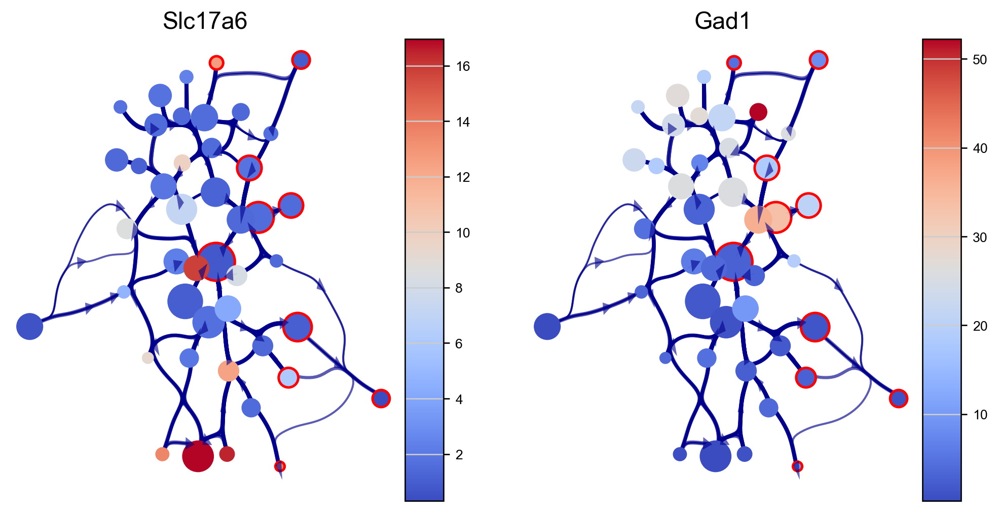

2024-03-01 17:15:43.368731	Graph has 1 connected components before pruning
2024-03-01 17:15:43.384329	Graph has 1 connected components after pruning
2024-03-01 17:15:43.384329	Graph has 1 connected components after reconnecting
2024-03-01 17:15:43.384329	Make via clustergraph edgebundle
2024-03-01 17:15:45.484062	Hammer dims: Nodes shape: (44, 2) Edges shape: (1706, 3)


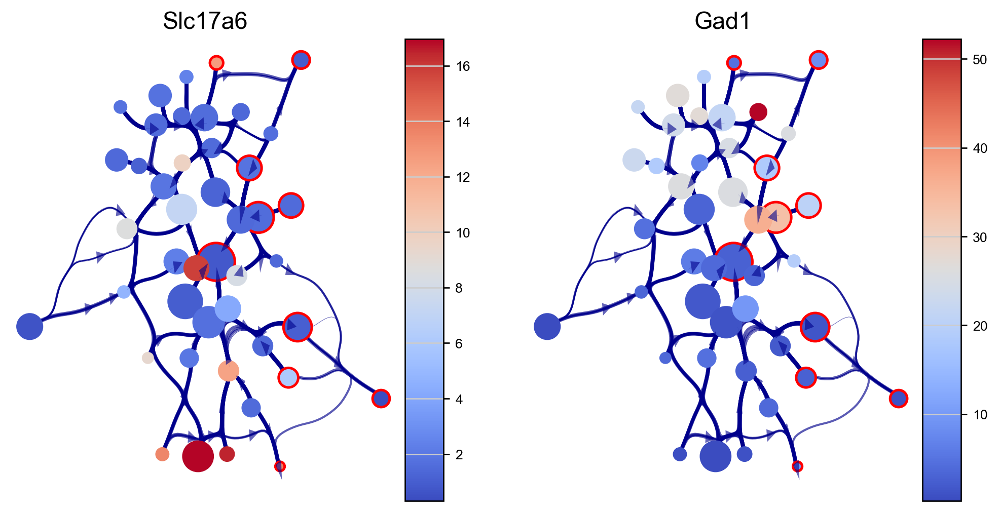

2024-03-01 17:15:51.480837	Graph has 1 connected components before pruning
2024-03-01 17:15:51.480837	Graph has 1 connected components after pruning
2024-03-01 17:15:51.480837	Graph has 1 connected components after reconnecting
2024-03-01 17:15:51.496438	Make via clustergraph edgebundle
2024-03-01 17:15:52.898684	Hammer dims: Nodes shape: (44, 2) Edges shape: (1424, 3)


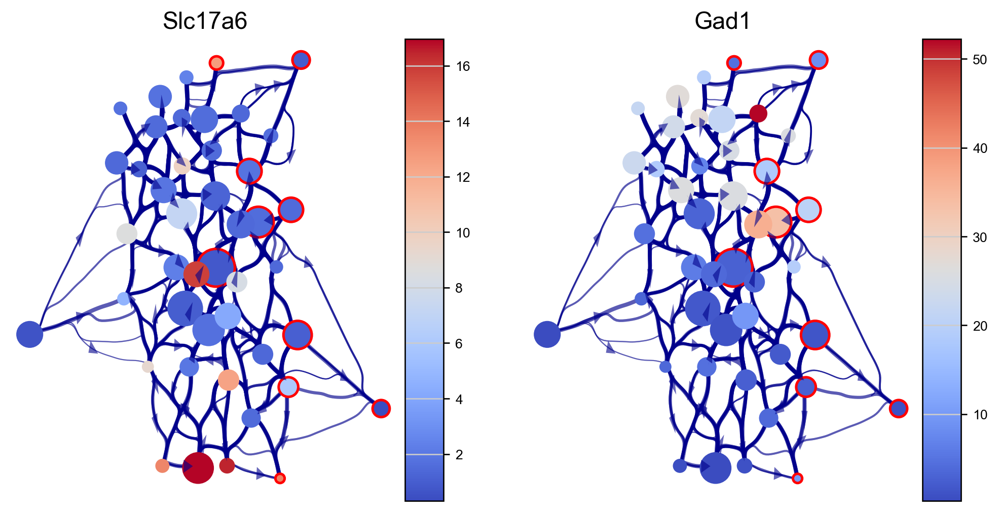

2024-03-01 17:15:58.248346	Graph has 1 connected components before pruning
2024-03-01 17:15:58.248346	Graph has 1 connected components after pruning
2024-03-01 17:15:58.248346	Graph has 1 connected components after reconnecting
2024-03-01 17:15:58.248346	Make via clustergraph edgebundle
2024-03-01 17:15:59.888822	Hammer dims: Nodes shape: (44, 2) Edges shape: (1424, 3)


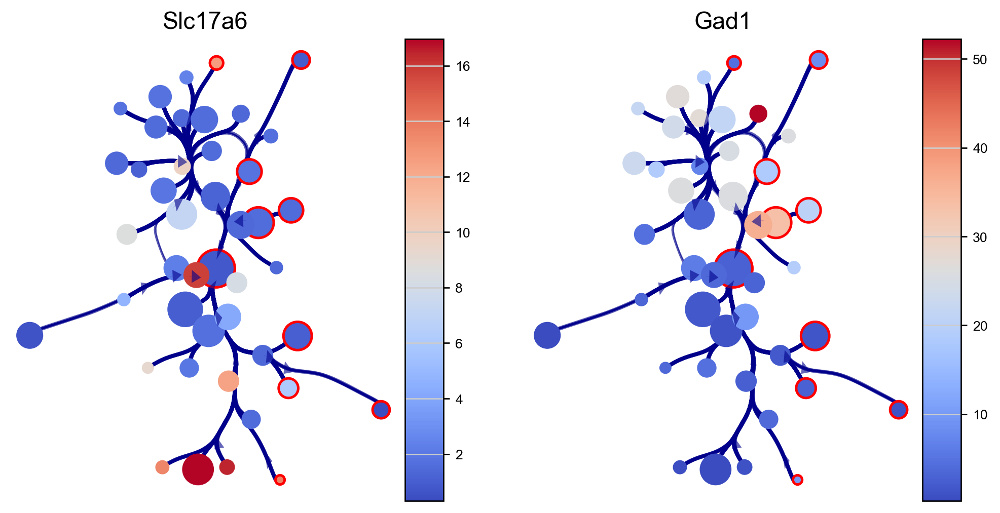

In [8]:
genes=['Slc17a6', 'Gad1']
df_genes_sc = pd.DataFrame(adata[:, genes].X.todense(), columns=genes)
fig, axs=via.plot_viagraph(via_object=v0, df_genes=df_genes_sc, gene_list=genes, label_text=False, 
                           tune_edges=True, edgebundle_pruning=0.7, decay=0.9, initial_bandwidth=0.05)
fig.set_size_inches(10,5)
plt.show()
fig, axs=via.plot_viagraph(via_object=v0, df_genes=df_genes_sc, gene_list=genes, label_text=False, 
                           tune_edges=True, edgebundle_pruning=0.9, decay=0.9, initial_bandwidth=0.05)
fig.set_size_inches(10,5)
plt.show()
fig, axs=via.plot_viagraph(via_object=v0, df_genes=df_genes_sc, gene_list=genes, label_text=False, 
                           tune_edges=True, edgebundle_pruning=0.7, decay=0.5, initial_bandwidth=0.05)
fig.set_size_inches(10,5)
plt.show()
fig, axs=via.plot_viagraph(via_object=v0, df_genes=df_genes_sc, gene_list=genes, label_text=False, 
                           tune_edges=True, edgebundle_pruning=0.7, decay=0.9, initial_bandwidth=0.1)
fig.set_size_inches(10,5)
plt.show()

## Reveal cell positions in tissue slice
We can highlight the cells positions in the tissue slice based on clusters.

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)


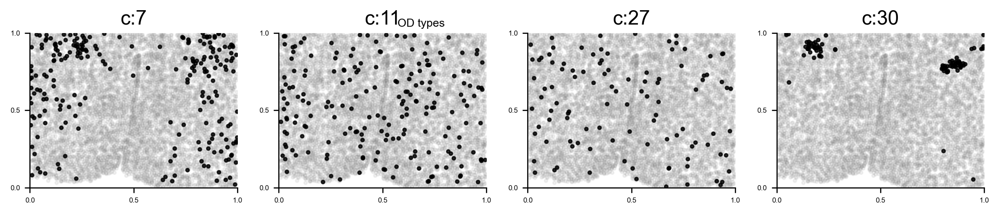

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


dict cluster to majority pop: {0: 'Endothelial', 1: 'Astrocyte', 2: 'Astrocyte', 3: 'xExcitatory', 4: 'xExcitatory', 5: 'Inhibitory', 6: 'Ambiguous', 7: 'OD_Mature', 8: 'Inhibitory', 9: 'Ependymal', 10: 'Inhibitory', 11: 'OD_Immature', 12: 'Inhibitory', 13: 'Astrocyte', 14: 'xExcitatory', 15: 'Ambiguous', 16: 'Inhibitory', 17: 'Inhibitory', 18: 'Inhibitory', 19: 'Inhibitory', 20: 'xExcitatory', 21: 'Microglia', 22: 'xExcitatory', 23: 'xExcitatory', 24: 'Ambiguous', 25: 'Inhibitory', 26: 'Endothelial', 27: 'OD_Immature', 28: 'Inhibitory', 29: 'Pericytes', 30: 'OD_Mature', 31: 'Inhibitory', 32: 'xExcitatory', 33: 'Inhibitory', 34: 'xExcitatory', 35: 'Inhibitory', 36: 'Inhibitory', 37: 'xExcitatory', 38: 'Inhibitory', 39: 'Inhibitory', 40: 'xExcitatory', 41: 'Inhibitory', 42: 'xExcitatory', 43: 'xExcitatory'}
list of clusters for each majority {'Endothelial': [0, 26], 'Astrocyte': [1, 2, 13], 'xExcitatory': [3, 4, 14, 20, 22, 23, 32, 34, 37, 40, 42, 43], 'Inhibitory': [5, 8, 10, 12, 16, 1

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


df_coords_majref  shape (6509, 2)
df_coords_majref  shape (6509, 2)


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


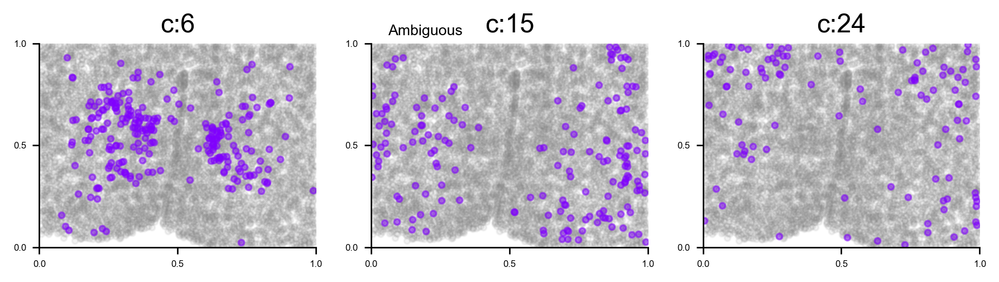

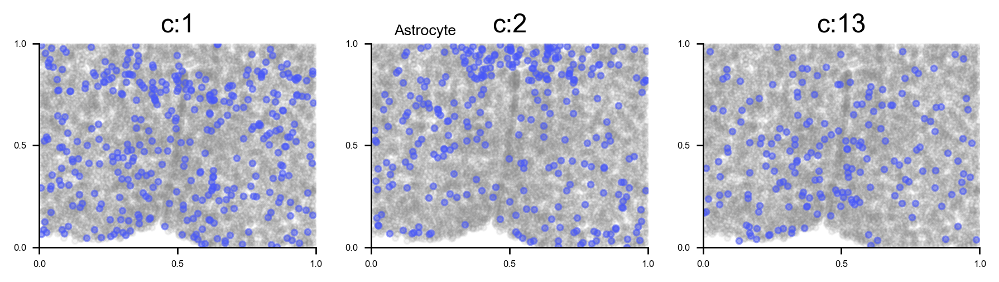

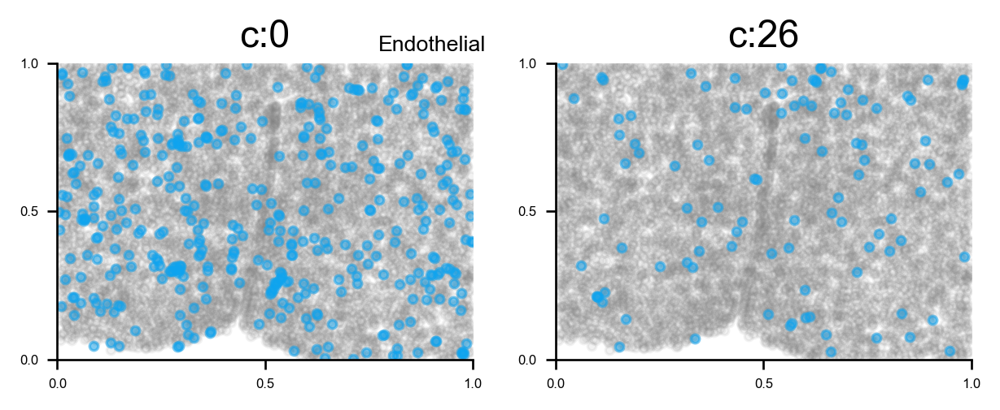

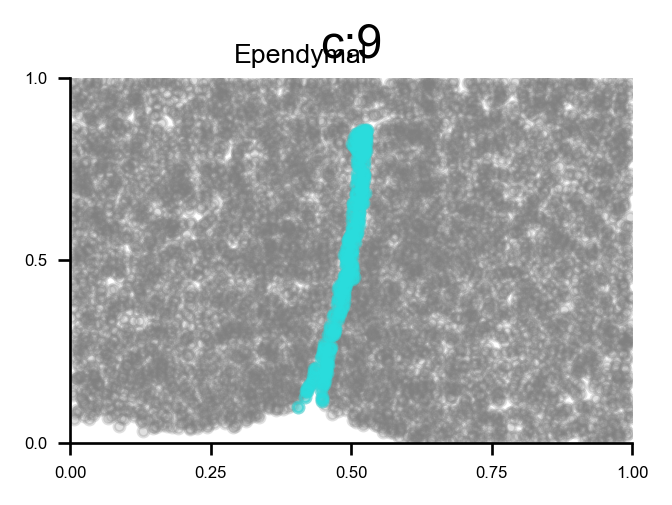

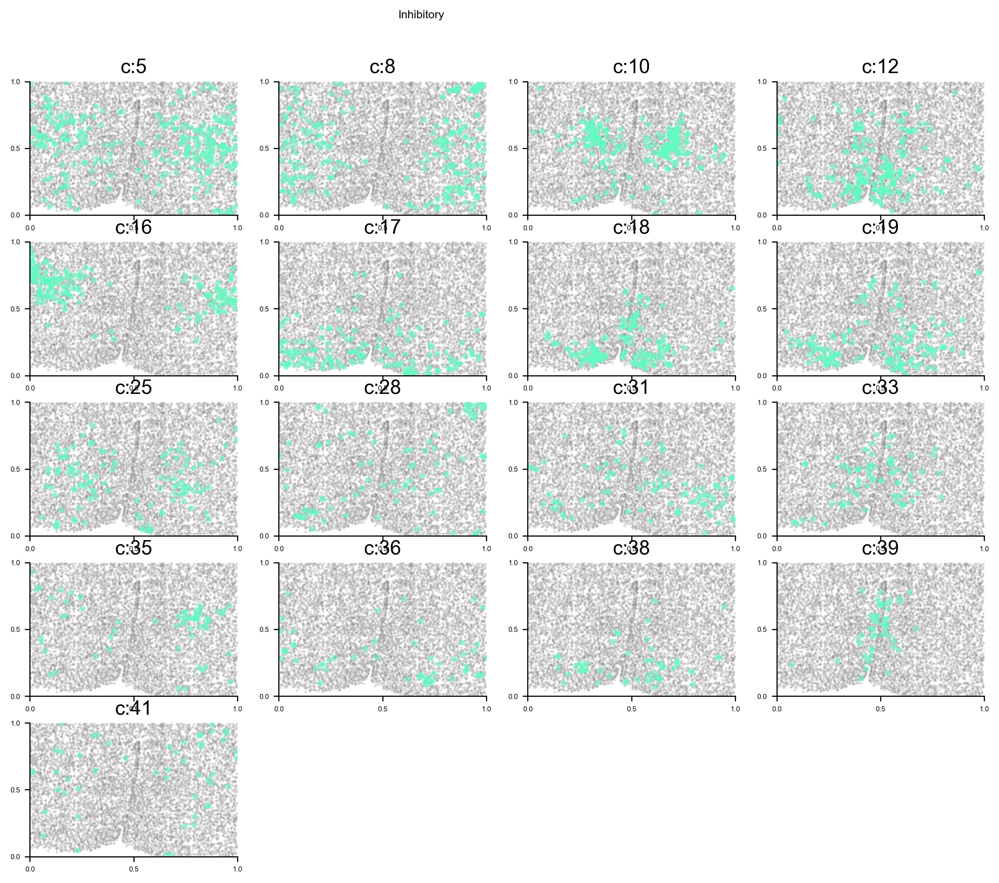

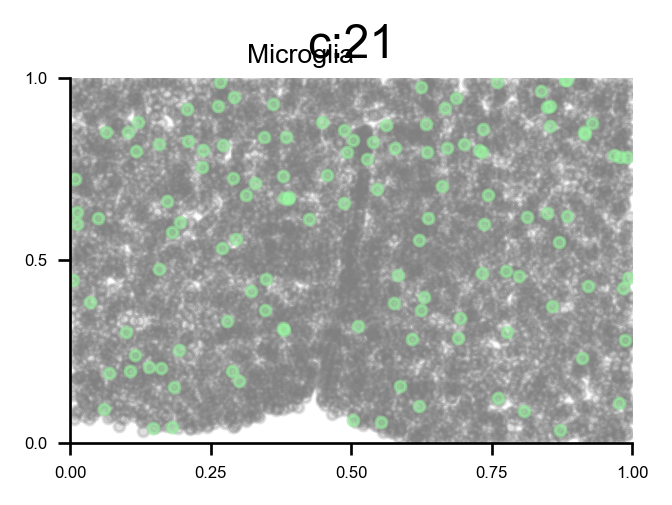

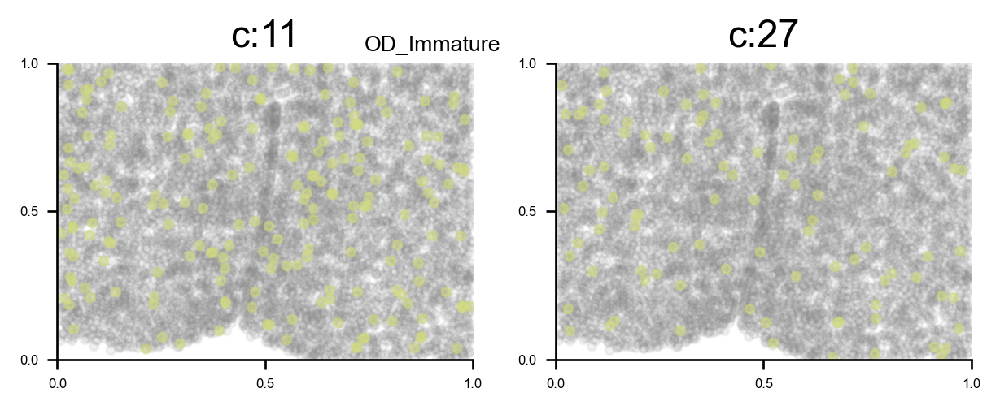

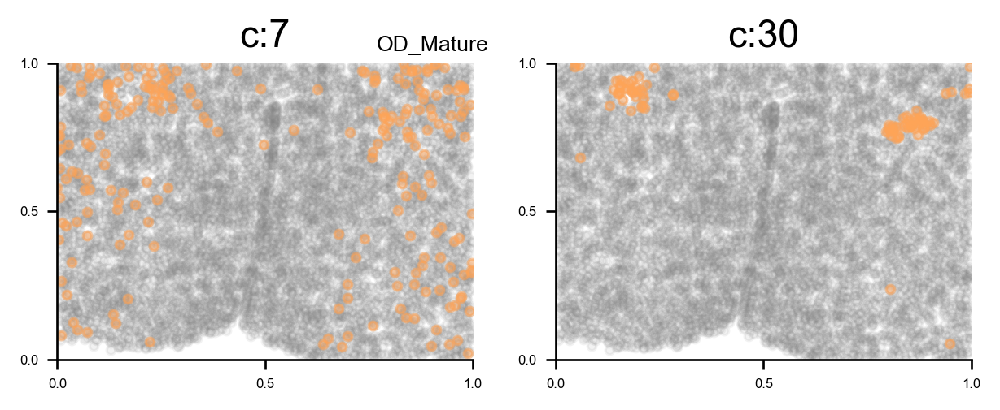

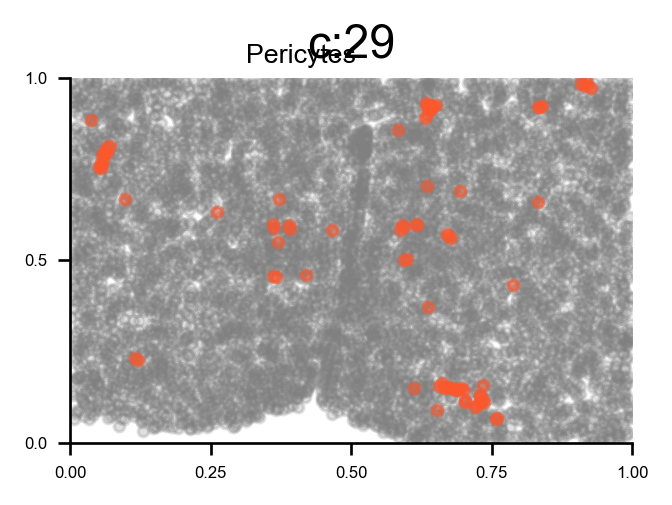

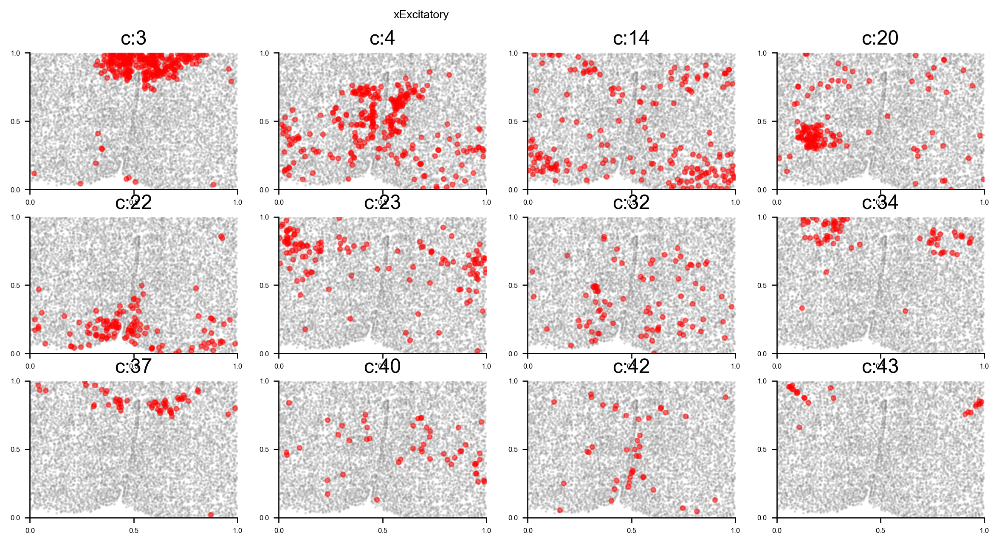

In [9]:
# Plot selected clusters on the tissue slice
f, ax = via.plot_clusters_spatial(spatial_coords=coords, clusters = [7,11,27,30], color='black', 
                                  via_labels=v0.labels, title_sup='OD types', alpha = 0.8, s=5)
f.set_size_inches(12, 2)
plt.show()

# plot all clusters on the tissue slices (one figure for each major cell type in True_label, and one subplot for each cluster)
f_ax_list = via.plot_all_spatial_clusters(spatial_coords= adata.obsm['spatial'], true_label=true_label, 
                                          via_labels=v0.labels, color_dict=color_dict, save_to=WORK_PATH, 
                                          verbose = False)
for f, ax in f_ax_list:
    f.set_size_inches(3*np.clip(4,0,len(f.axes)), 2*(-(-len(f.axes)//4)))
plt.show()

(6509, 2)
dict cluster to majority pop: {0: 'Endothelial', 1: 'Astrocyte', 2: 'Astrocyte', 3: 'xExcitatory', 4: 'xExcitatory', 5: 'Inhibitory', 6: 'Ambiguous', 7: 'OD_Mature', 8: 'Inhibitory', 9: 'Ependymal', 10: 'Inhibitory', 11: 'OD_Immature', 12: 'Inhibitory', 13: 'Astrocyte', 14: 'xExcitatory', 15: 'Ambiguous', 16: 'Inhibitory', 17: 'Inhibitory', 18: 'Inhibitory', 19: 'Inhibitory', 20: 'xExcitatory', 21: 'Microglia', 22: 'xExcitatory', 23: 'xExcitatory', 24: 'Ambiguous', 25: 'Inhibitory', 26: 'Endothelial', 27: 'OD_Immature', 28: 'Inhibitory', 29: 'Pericytes', 30: 'OD_Mature', 31: 'Inhibitory', 32: 'xExcitatory', 33: 'Inhibitory', 34: 'xExcitatory', 35: 'Inhibitory', 36: 'Inhibitory', 37: 'xExcitatory', 38: 'Inhibitory', 39: 'Inhibitory', 40: 'xExcitatory', 41: 'Inhibitory', 42: 'xExcitatory', 43: 'xExcitatory'}
list of clusters for each majority {'Endothelial': [0, 26], 'Astrocyte': [1, 2, 13], 'xExcitatory': [3, 4, 14, 20, 22, 23, 32, 34, 37, 40, 42, 43], 'Inhibitory': [5, 8, 10,

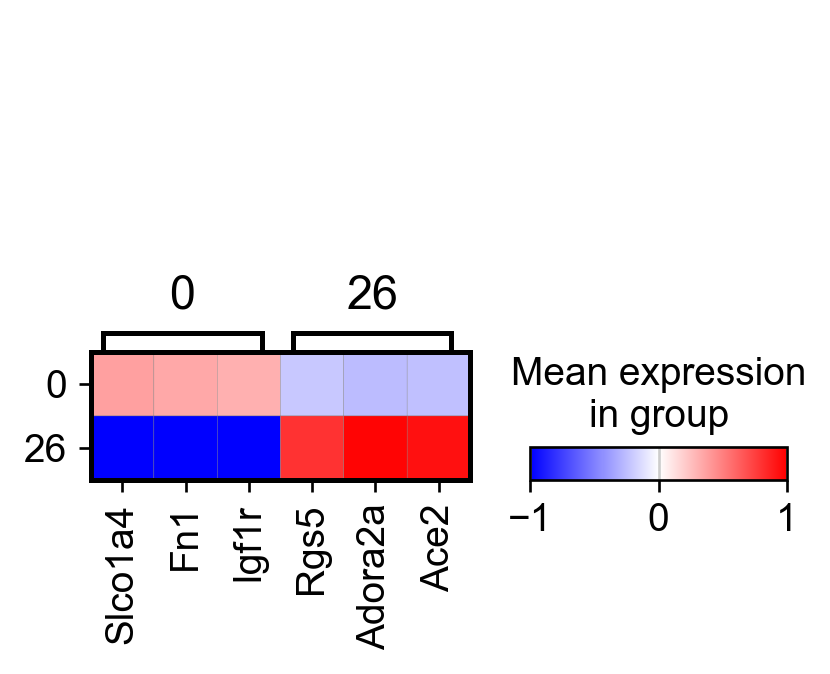

         Falling back to preprocessing with `sc.pp.pca` and default params.


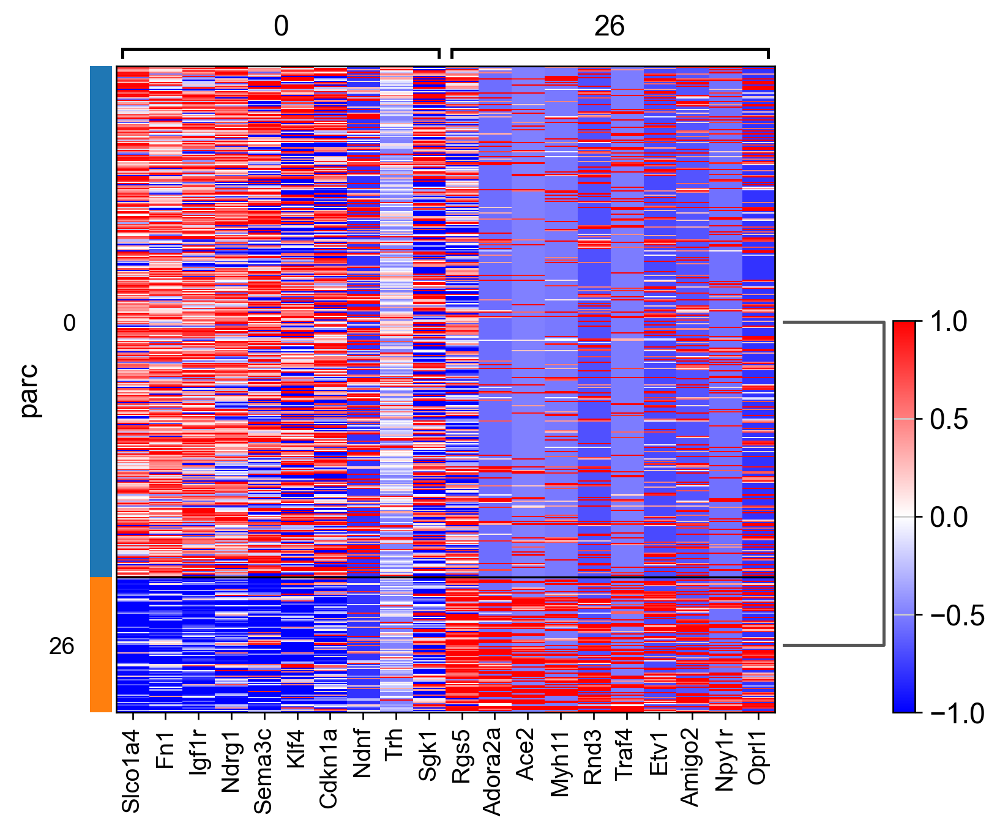

AnnData object with n_obs × n_vars = 846 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'
         Falling back to preprocessing with `sc.pp.pca` and default params.


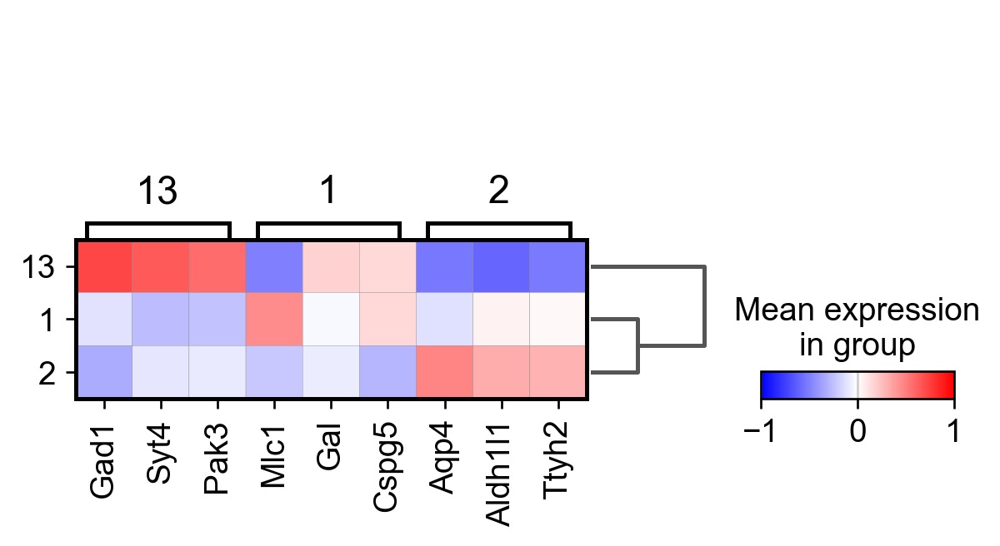

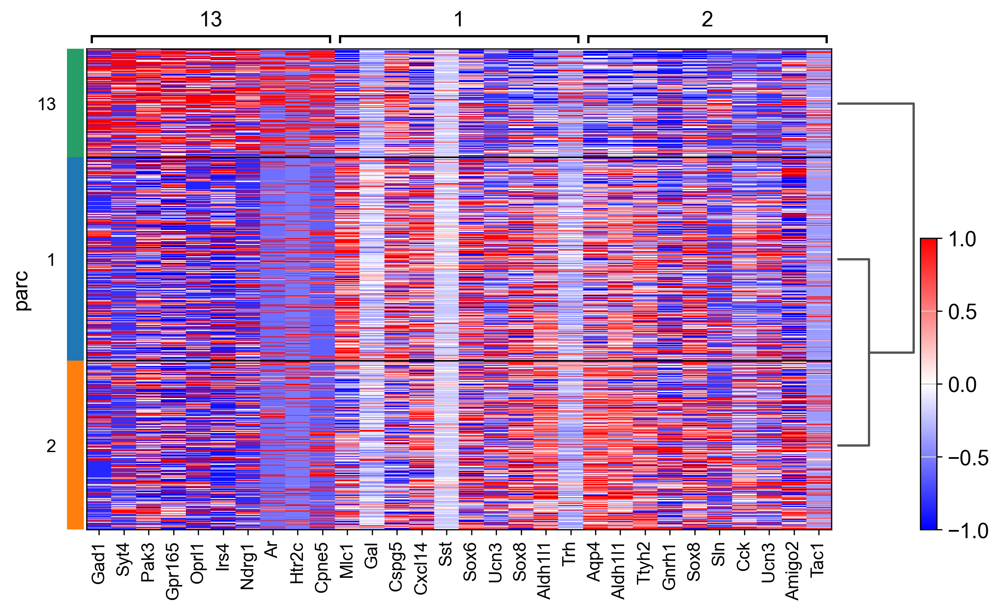

AnnData object with n_obs × n_vars = 1447 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'
         Falling back to preprocessing with `sc.pp.pca` and default params.


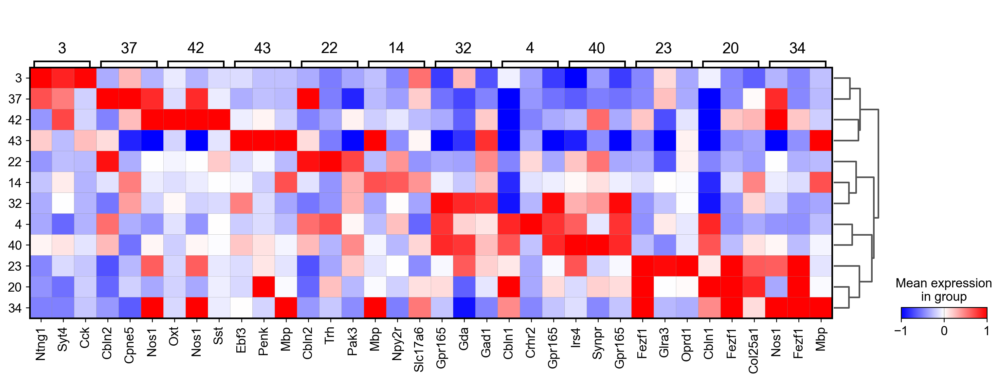

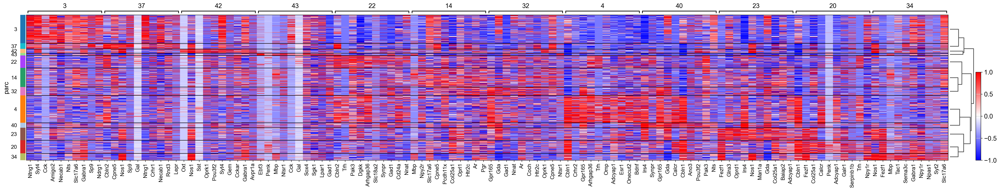

AnnData object with n_obs × n_vars = 2162 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'
         Falling back to preprocessing with `sc.pp.pca` and default params.


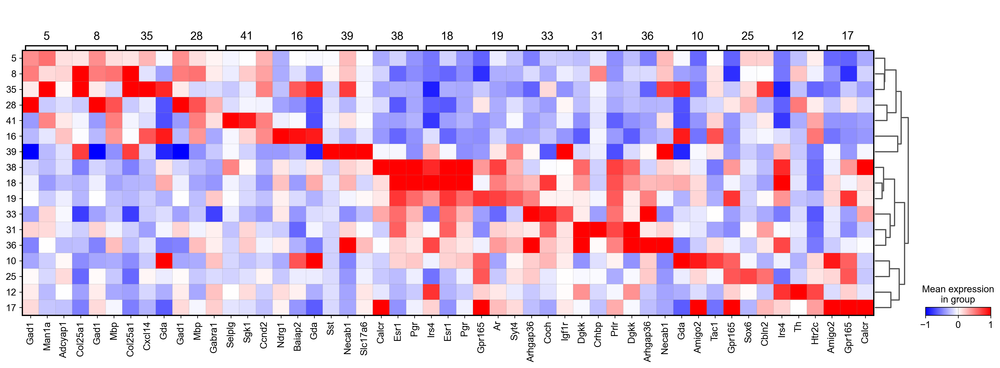

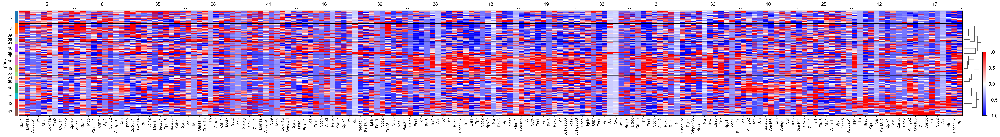

AnnData object with n_obs × n_vars = 523 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'
         Falling back to preprocessing with `sc.pp.pca` and default params.


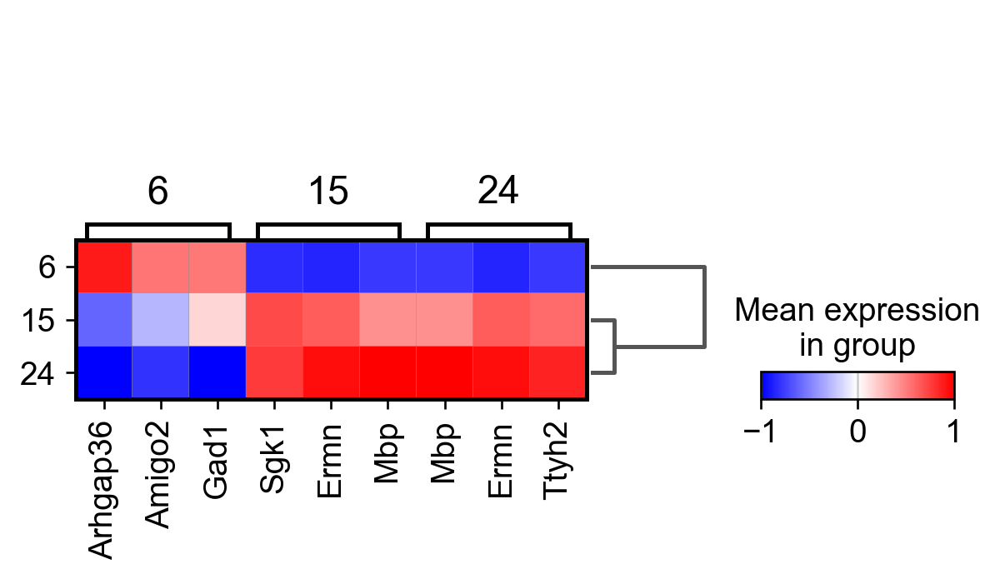

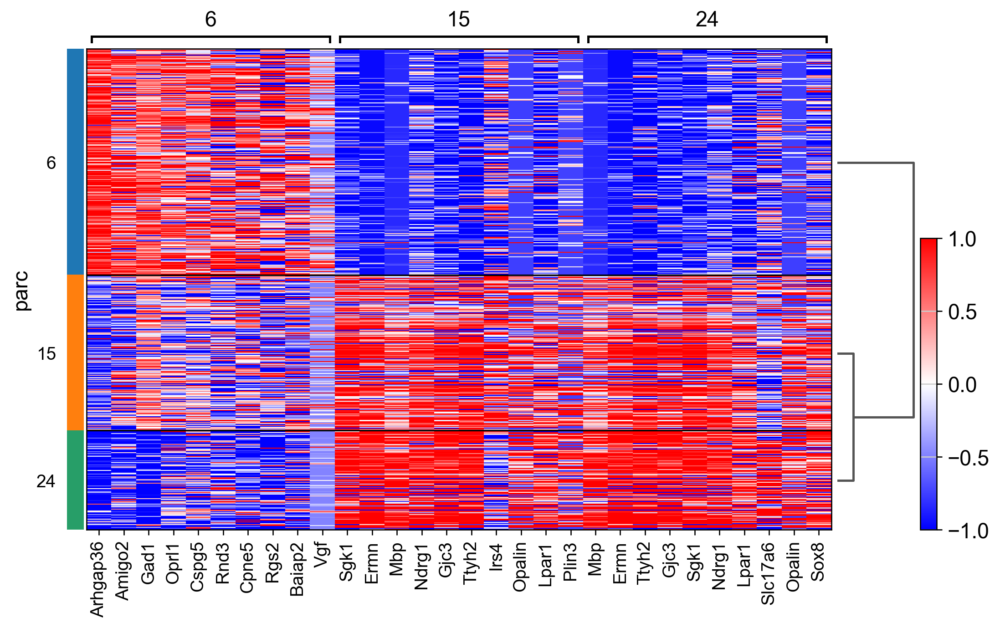

AnnData object with n_obs × n_vars = 307 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'


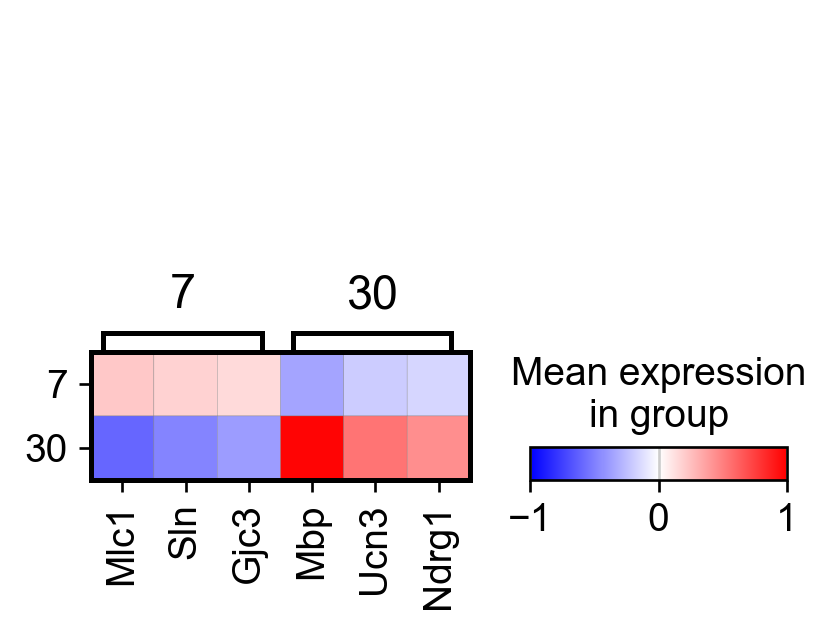

         Falling back to preprocessing with `sc.pp.pca` and default params.


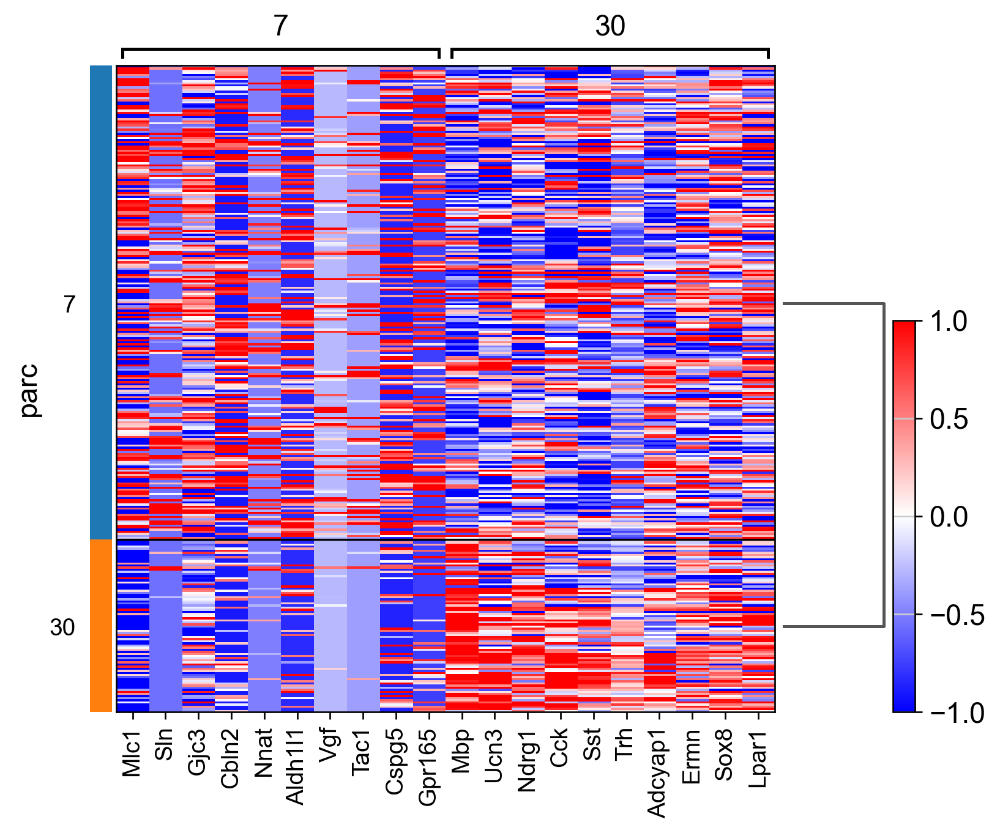

AnnData object with n_obs × n_vars = 304 × 161
    obs: 'Cell_ID', 'Animal_ID', 'Animal_sex', 'Behavior', 'Bregma', 'Centroid_X', 'Centroid_Y', 'Cell_class', 'Neuron_cluster_ID', 'batch', 'true_label', 'parc_num', 'parc'
    uns: 'Cell_class_colors', 'log1p'
    obsm: 'spatial', 'spatial3d', 'X_spatial_adjusted', 'spatial_pca'
    layers: 'scaled'


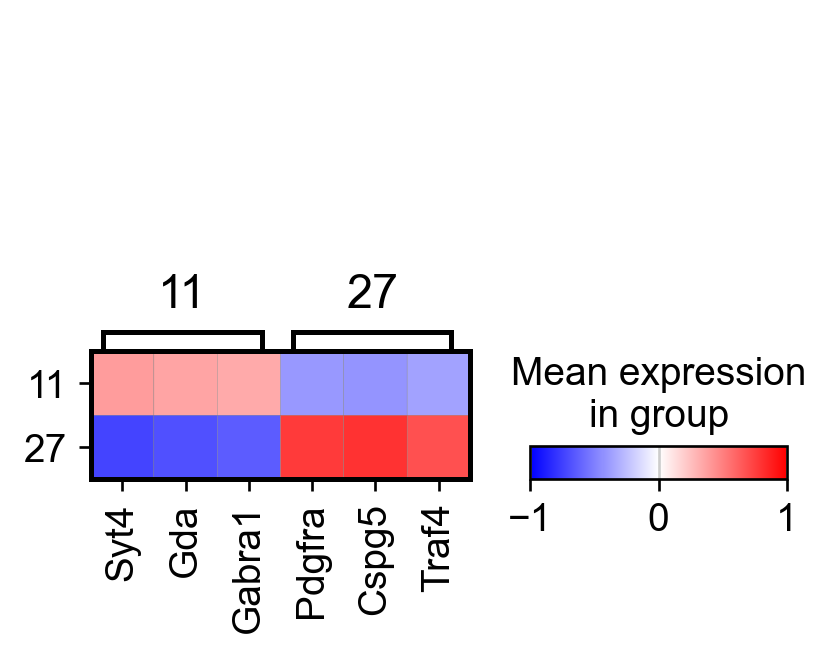

         Falling back to preprocessing with `sc.pp.pca` and default params.


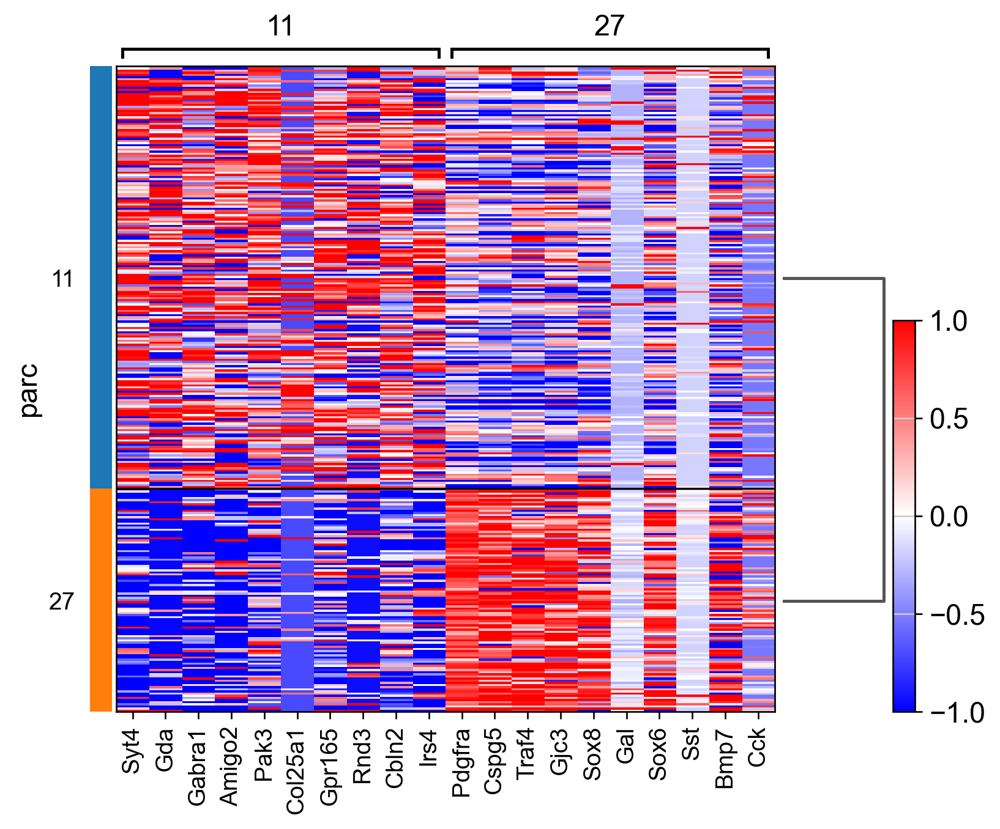

In [10]:
do_rank_genes = True
adata.obs['parc_num'] = [i for i in v0.labels]
adata.obs['parc'] = [str(i) for i in v0.labels]
adata.strings_to_categoricals()

if do_rank_genes: # can also run this later, using via.labels clustering labels determined/saved after run_via()
    
    print(adata.obsm['spatial'].shape)
    adata.raw = adata
    sc.pp.log1p(adata)  # tl.rank_genes expects logarithmized data. If you want to see raw numbers then consider skipping this step

    class_to_cluster_dict = via.make_dict_of_clusters_for_each_celltype(via_labels=v0.labels, true_label=true_label,
                                                                        verbose=True)
    for key in class_to_cluster_dict: # ['Astrocyte','Inhibitory','xExcitatory','Ambiguous',] or choose a subset of cell types 
        if len(class_to_cluster_dict[key]) == 1: continue
        adata_ = adata[adata.obs['parc_num'].isin(class_to_cluster_dict[key])]
        adata_.layers['scaled'] = sc.pp.scale(adata_, copy=True).X
        print(adata_)
        sc.tl.rank_genes_groups(adata_, groupby="parc", method='wilcoxon')#, use_raw=True)
        sc.pl.rank_genes_groups_matrixplot(adata_, n_genes=3, use_raw=False, vmin=-1, vmax=1, cmap='bwr', layer='scaled')
        sc.pl.rank_genes_groups_heatmap(adata_, n_genes=10,  show_gene_labels=True, cmap='bwr', vmin=-1,vmax=1, layer='scaled', use_raw=False) 

## Atlas View

Here we try and compute two different embeddings to construct the atlas views and compare those results.
1. VIA multidimensional scaling mds
2. VIA modified HNSW graph

In [11]:
# Extract cluster and cell type labels from via object to get major cell type population within each clusters.
df_mode = pd.DataFrame()
df_mode['cluster'] = v0.labels
df_mode['celltype'] = v0.true_label
majority_cluster_population_dict = df_mode.groupby(['cluster'])['celltype'].agg(
    lambda x: pd.Series.mode(x)[0])  # agg(pd.Series.mode would give all modes) #series
majority_cluster_population_dict = majority_cluster_population_dict.to_dict()
print(f'dict cluster to majority pop: {majority_cluster_population_dict}')

dict cluster to majority pop: {0: 'Endothelial', 1: 'Astrocyte', 2: 'Astrocyte', 3: 'xExcitatory', 4: 'xExcitatory', 5: 'Inhibitory', 6: 'Ambiguous', 7: 'OD_Mature', 8: 'Inhibitory', 9: 'Ependymal', 10: 'Inhibitory', 11: 'OD_Immature', 12: 'Inhibitory', 13: 'Astrocyte', 14: 'xExcitatory', 15: 'Ambiguous', 16: 'Inhibitory', 17: 'Inhibitory', 18: 'Inhibitory', 19: 'Inhibitory', 20: 'xExcitatory', 21: 'Microglia', 22: 'xExcitatory', 23: 'xExcitatory', 24: 'Ambiguous', 25: 'Inhibitory', 26: 'Endothelial', 27: 'OD_Immature', 28: 'Inhibitory', 29: 'Pericytes', 30: 'OD_Mature', 31: 'Inhibitory', 32: 'xExcitatory', 33: 'Inhibitory', 34: 'xExcitatory', 35: 'Inhibitory', 36: 'Inhibitory', 37: 'xExcitatory', 38: 'Inhibitory', 39: 'Inhibitory', 40: 'xExcitatory', 41: 'Inhibitory', 42: 'xExcitatory', 43: 'xExcitatory'}


### VIA mds embedding

Fast comupatation methods of a embedding thus compatible with highly scaled datasets and suitable for testing out numerous parameters.

2024-03-01 17:16:32.752399	Commencing Via-MDS
minrowznormed -7874.4873
2024-03-01 17:16:35.362182	Start computing with diffusion power:1
2024-03-01 17:16:35.811552	Starting MDS on milestone
2024-03-01 17:16:56.161209	End computing mds with diffusion power:1


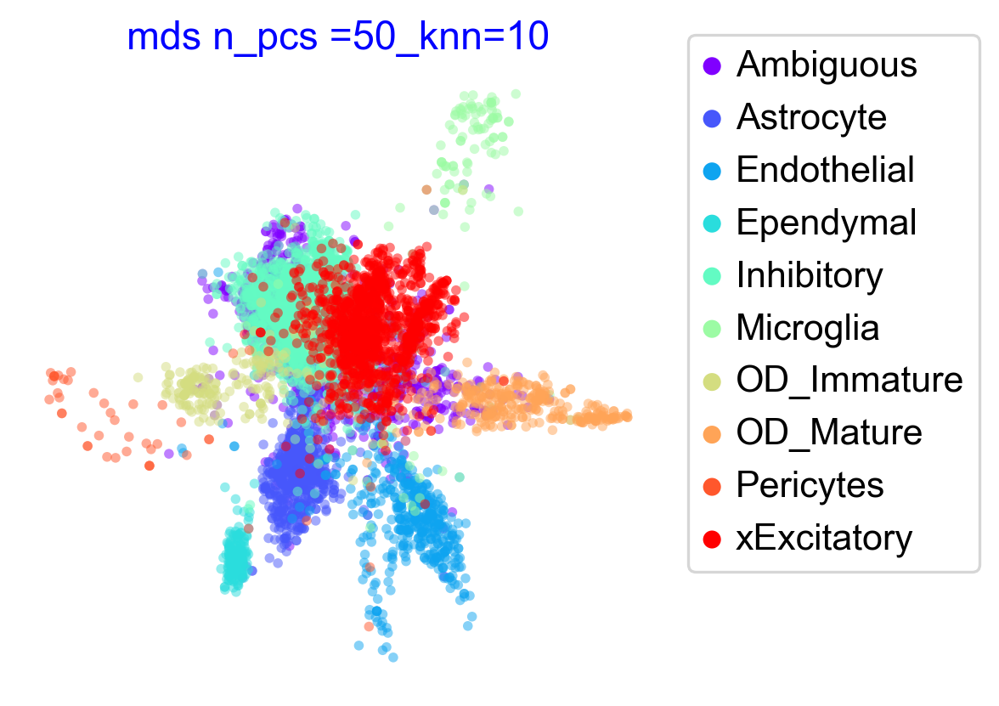

In [12]:
mds_title = 'mds n_pcs ='+str(n_pcs) +'_knn='+str(knn)
emb_mds = via.via_mds(via_object=v0, n_milestones=5000)

f1, ax1 = via.plot_scatter(embedding=emb_mds, labels=true_label, title=mds_title, alpha=0.5,s=12,show_legend=True,color_dict=color_dict, text_labels=False)
ax1.get_legend().set_bbox_to_anchor((1.05, 1.05))
plt.show()

2024-03-01 17:16:56.455572	Start finding milestones
2024-03-01 17:16:58.151925	End milestones with 300
2024-03-01 17:16:58.151925	Recompute weights
2024-03-01 17:16:58.198796	pruning milestone graph based on recomputed weights
2024-03-01 17:16:58.198796	Graph has 1 connected components before pruning
2024-03-01 17:16:58.198796	Graph has 1 connected components after pruning
2024-03-01 17:16:58.198796	Graph has 1 connected components after reconnecting
2024-03-01 17:16:58.214419	regenerate igraph on pruned edges
2024-03-01 17:16:58.261290	Setting numeric label as single cell pseudotime for coloring edges
2024-03-01 17:16:58.323785	Making smooth edges
inside add sc embedding second if


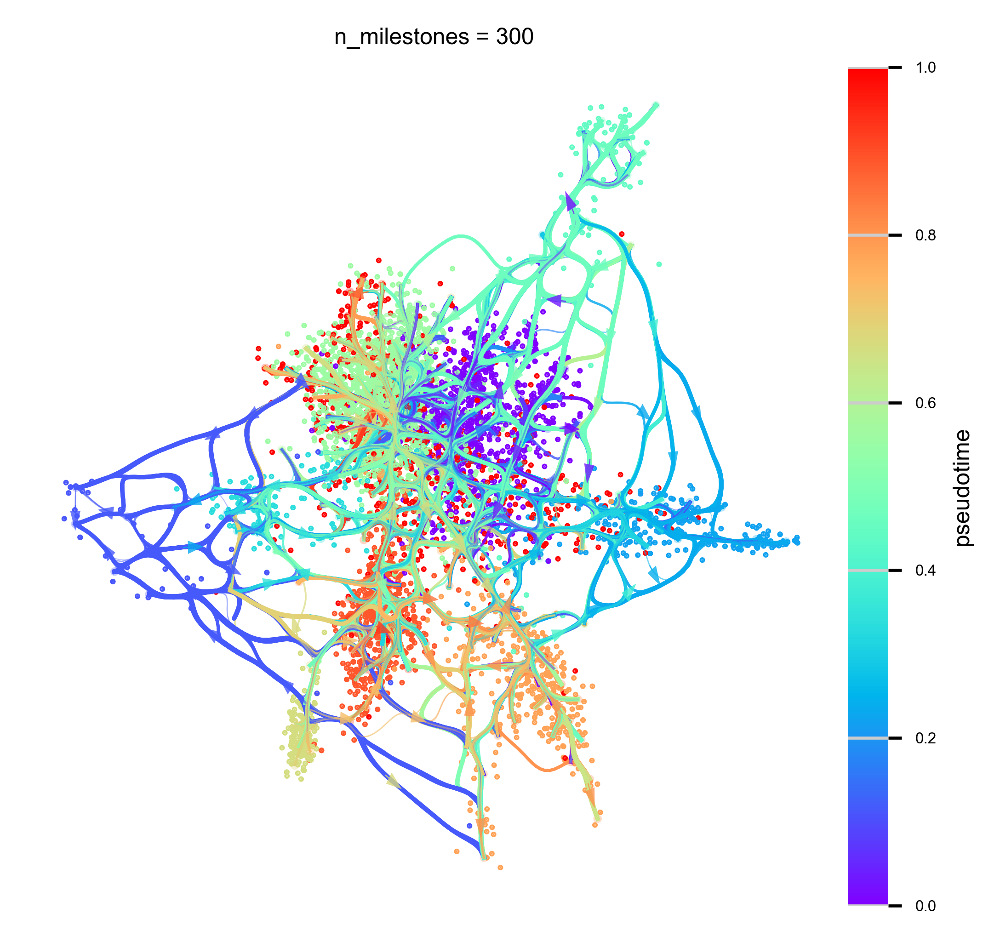

inside add sc embedding second if


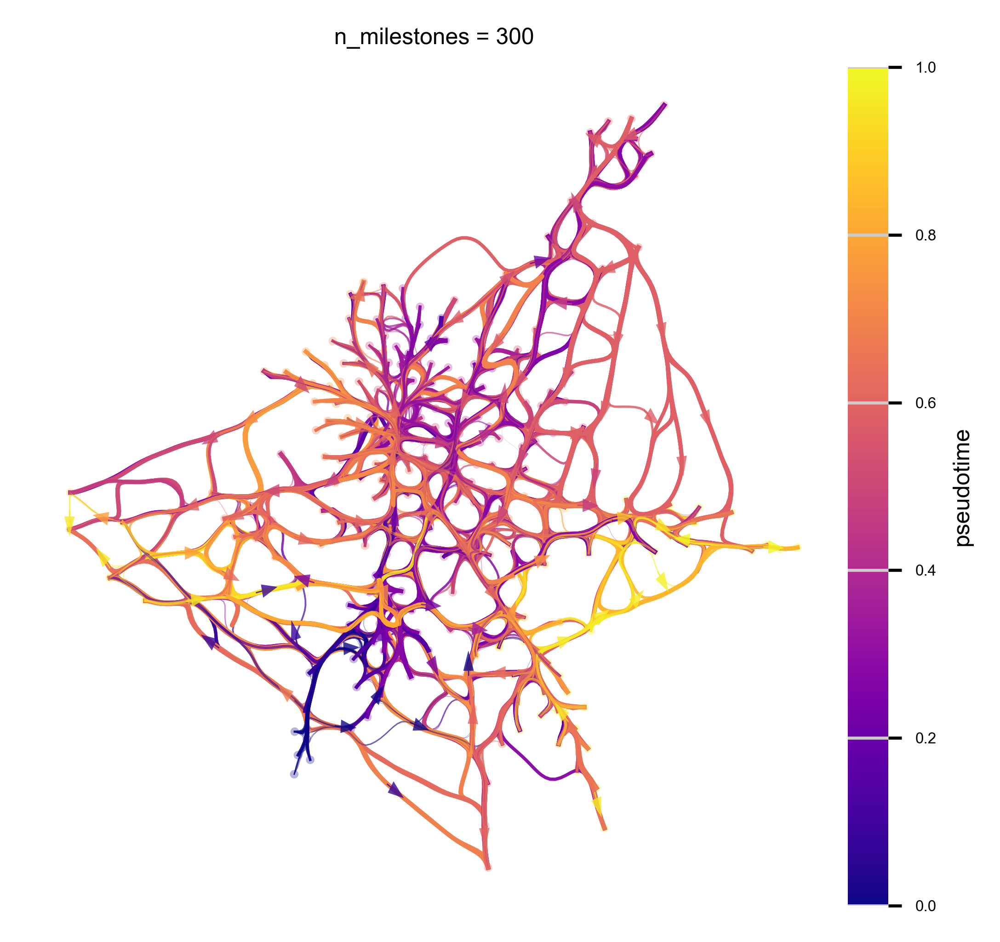

In [13]:
n_milestones = 300
i_bw = 0.03
decay=0.6
global_visual_pruning = 0.6
v0.embedding =emb_mds#emb
sc_scatter_alpha=0.4
sc_scatter_size=0.2
headwidth_bundle = 0.01
linewidth_bundle = 1
hammerbundle_dict = via.make_edgebundle_milestone(via_object=v0, n_milestones=n_milestones, decay=decay,
                                                  initial_bandwidth=i_bw, global_visual_pruning=global_visual_pruning)
v0.hammerbundle_milestone_dict = hammerbundle_dict  # make the hmbd in one shot to be used for all plots

f,ax = via.plot_atlas_view(via_object=v0, add_sc_embedding=True, sc_labels_expression=true_label, sc_labels=true_label, 
                           sc_scatter_size=sc_scatter_size, sc_scatter_alpha=sc_scatter_alpha,
                           cmap='rainbow', linewidth_bundle=linewidth_bundle, 
                           headwidth_bundle=headwidth_bundle)
plt.show()

f,ax = via.plot_atlas_view(via_object=v0, add_sc_embedding=True, sc_labels=true_label, 
                           sc_scatter_size=sc_scatter_size, sc_scatter_alpha=sc_scatter_alpha,
                           cmap='plasma', linewidth_bundle=linewidth_bundle, 
                           headwidth_bundle=headwidth_bundle)
plt.show()